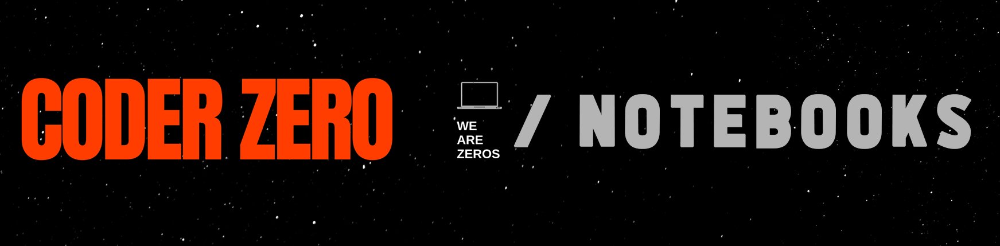

# 🦸🏾‍♂️ SuperGradients 

SuperGradients is a PyTorch based training library.

It provides a uniform interface for the most common computer vision use cases: 

- Classification

- Detection

- Segmentation

- Pose estimation

---------------------------------------------------------------

*   Dataset: https://www.kaggle.com/datasets/nguyngiabol/colorful-fashion-dataset-for-object-detection
*   YOLO NAS github: https://github.com/Deci-AI/super-gradients/blob/master/YOLONAS.md
*   Model zoo: https://github.com/Deci-AI/super-gradients/blob/master/documentation/source/model_zoo.md 





YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)

In [ ]:
### available GPU
!nvidia-smi

/bin/bash: nvidia-smi: command not found


In [ ]:
### installing required libraries
!pip install super-gradients==3.1.0
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 54.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 102.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 101.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 94.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 M

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=f4d24f80353600759b1d2d1d7fca57de2d39e68828fadfdd90b79fff297fcd37
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 2.4.5
    Uninstalling pyparsing-2.4.5:
      Successfully uninstalled pyparsing-2.4.5
  A

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.8 MB/s eta 0:00:00


In [ ]:
## importing required libraries
import os
import shutil
import random

!pip install tqdm --upgrade
from tqdm.notebook import tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Train-Test Data Preparation:

In [ ]:
## connecting to the google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
### specifying data path

train_path_img = "./yolo_data/train/images/"
train_path_label = "./yolo_data/train/labels/"
val_path_img = "./yolo_data/valid/images/"
val_path_label = "./yolo_data/valid/labels/"
test_path = "./yolo_data/test/images/"
test_path_label = "./yolo_data/test/labels/"

In [ ]:
'''
Split the dataset into train and test and creates the train.txt and test.tx with
the respective path of the images in each folder
'''

def train_test_split(path,neg_path=None, split = 0.2):
    print("------ PROCESS STARTED -------")


    files = list(set([name[:-4] for name in os.listdir(path)])) ## removing duplicate names i.e. counting only number of images
    

    print (f"--- This folder has a total number of {len(files)} images---")
    random.seed(42)
    random.shuffle(files)

    test_size = int(len(files) * split)
    train_size = len(files) - test_size

    ## creating required directories

    os.makedirs(train_path_img, exist_ok = True)
    os.makedirs(train_path_label, exist_ok = True)
    os.makedirs(val_path_img, exist_ok = True)
    os.makedirs(val_path_label, exist_ok = True)

    
    ### ----------- copying images to train folder
    for filex in tqdm(files[:train_size]):
      if filex == 'classes':
          continue
      shutil.copy2(path + filex + '.jpg',f"{train_path_img}/" + filex + '.jpg' )
      shutil.copy2(path + filex + '.txt', f"{train_path_label}/" + filex + '.txt')
        
    

    print(f"------ Training data created with 80% split {len(files[:train_size])} images -------")
    
    if neg_path:
        neg_images = list(set([name[:-4] for name in os.listdir(neg_path)])) ## removing duplicate names i.e. counting only number of images
        for filex in tqdm(neg_images):
            shutil.copy2(neg_path+filex+ ".jpg", f"{train_path_img}/" + filex + '.jpg')
            
        print(f"------ Total  {len(neg_images)} negative images added to the training data -------")
    
        print(f"------ TOTAL Training data created with {len(files[:train_size]) + len(neg_images)} images -------")
    


    ### copytin images to validation folder
    for filex in tqdm(files[train_size:]):
      if filex == 'classes':
          continue
      # print("running")
      shutil.copy2(path + filex + '.jpg', f"{val_path_img}/" + filex + '.jpg' )
      shutil.copy2(path + filex + '.txt', f"{val_path_label}/" + filex + '.txt')

    print(f"------ Testing data created with a total of {len(files[train_size:])} images ----------")
    
    print("------ TASK COMPLETED -------")

## spliting the data into train-test and creating train.txt and test.txt files
# train_test_split('/content/drive/MyDrive/custom_notebooks/yolo_data/')

### for label_tag
train_test_split('/content/drive/MyDrive/yolo_nas/data/') ### without negative images
# train_test_split('./data/','./negative_images/') ### if you want to feed negative images

------ PROCESS STARTED -------
--- This folder has a total number of 2606 images---


  0%|          | 0/2085 [00:00<?, ?it/s]

------ Training data created with 80% split 2085 images -------


  0%|          | 0/521 [00:00<?, ?it/s]

------ Testing data created with a total of 521 images ----------
------ TASK COMPLETED -------


# 💾 Datasets and DataLoaders
SuperGradients is fully compatible with PyTorch Datasets and Dataloaders, so you can use your dataloaders as is. SuperGradients provides ready-to-use dataloaders for these datasets. If you're interested in learning more about working with `COCOFormatDetectionDataset` and the more general `DetectionDataset` [check out the SuperGradients documentation on this topic](https://docs.deci.ai/super-gradients/docstring/training/datasets/#training.datasets.detection_datasets.coco_detection.COCODetectionDataset)

In [ ]:
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val


dataset_params = {
    'data_dir':'/content/yolo_data',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'/content/drive/MyDrive/yolo_nas/test/images',
    'test_labels_dir':'/content/drive/MyDrive/yolo_nas/test/labels',
    'classes': ['sunglass','hat','jacket','shirt','pants','shorts','skirt','dress','bag','shoe']    
}

### Model parameters:

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [ ]:
import torch

MODEL_ARCH = 'yolo_nas_l'
DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 8
MAX_EPOCHS = 5
CHECKPOINT_DIR = f'/content/drive/MyDrive/yolo_nas/training_backup'
EXPERIMENT_NAME = f'yolo_nas_l_e5'

You pass the values for `dataset_params` into the `dataset_params` argument as shown below.

In [ ]:
### setting up dataloaders
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

Caching annotations:  99%|█████████▊| 76/77 [00:34<00:00,  2.03it/s]

### 🧐 Now inspect the dataset defined earlier. 

SuperGradients added `transforms` for you. You're free to experiment with these transformations as you please. You can also add in your own transformations from `torchvision.transforms`, `albumentations` or a custom tranformaton.

In [ ]:
### applying custom transformations
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': [640, 640], 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': [640, 640], 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5, 'max_targets': 120),
 DetectionPaddedRescale('swap': (2, 0, 1),

Caching annotations: 100%|██████████| 77/77 [01:10<00:00,  1.10it/s]


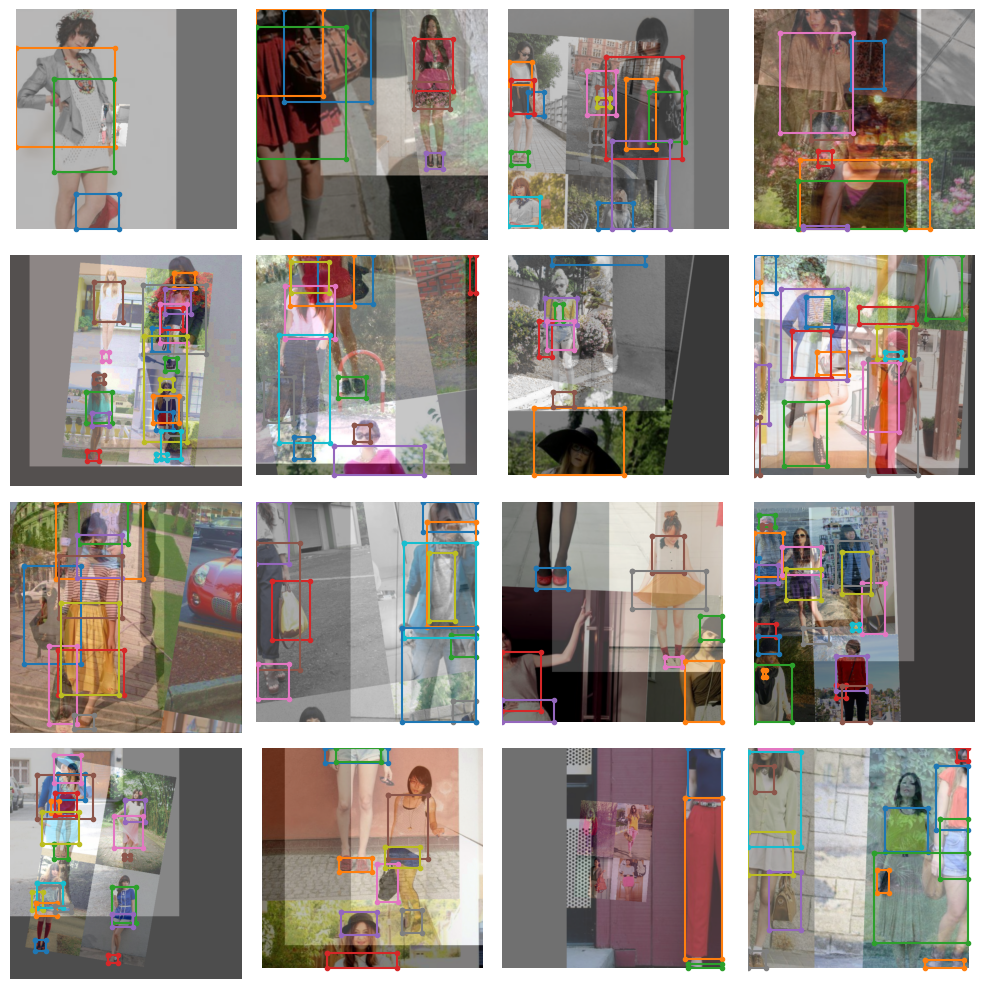

In [ ]:
### visualizing data after transformation
train_data.dataset.plot()

# 👩🏽‍🦳 Instantiating the model

You saw how to instantiate the model for inference earlier. 

Below is how to instantiate the model for finetuning. Note you need to add the `num_classes` argument here.

Note, for this tutorial you're using `yolo_nas_l`, but SuperGradients has two other flavors of YOLONAS available to you: `yolo_nas_s` and `yolo_nas_m`.

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH, 
    num_classes=len(dataset_params['classes']), 
    pretrained_weights="coco"
)

[2023-06-02 15:20:11] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth


  0%|          | 0.00/256M [00:00<?, ?B/s]

# 🎛️ Training parameters

You need to define the training parameters for your training run. 

Full details about the training parameters can be found [here](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### 🚨 There are a few **mandatory** arguments that you must define for training params 🚨

- `max_epochs` - Max number of training epochs

- `loss` - the loss function you want to use

- `optimizer` - Optimizer you will be using

- `train_metrics_list` - Metrics to log during training

- `valid_metrics_list` - Metrics to log during training

- `metric_to_watch` - metric which the model checkpoint will be saved according to

You can choose from a variety of `optimizer`'s such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into `optimizer_params`. 


### 🧑🏾‍🔬 Integrations with experiment monitoring tools

SuperGradients has native integrations with Tensorboard, Weights and Biases, ClearML, and DagsHub. 

If your favorite monitoring tool is not supported by SuperGradients, you can simply implement a class inheriting from BaseSGLogger that you will then pass to the training parameters.

If you're interested in monitoring experiments, you can learn more [in the docs](https://github.com/Deci-AI/super-gradients/blob/0fe46cd39572db34eb83d68e343fed97b8886fe9/documentation/source/experiment_monitoring.md).


### 🪄 SuperGradients offers a number of training tricks right out of the box, such as:

- Exponential moving average
- Zero weight decay on bias and batch normalizatiom
- Weight averaging
- Batch accumulation
- Precise BatchNorm

You can read more details about these training tricks [here](https://heartbeat.comet.ml/a-better-way-to-train-your-neural-networks-813b60a5bd6a).

If you're interested in building a using a custom metric with SuperGradients you can learn how [here](https://github.com/Deci-AI/super-gradients/blob/master/documentation/source/Metrics.md).

Note you will have to set number of classes in two places below: `PPYoloELoss` and `DetectionMetrics_050`.

You probably noticed that we make use of a post prediction callback, for details on how phase callbacks work in SuperGradients [check out our documentation](https://github.com/Deci-AI/super-gradients/blob/master/documentation/source/PhaseCallbacks.md).

### 🔕 Note: I've enabled `silent_mode` so the notebook doesn't get longer than it already is. You should disable it so you can see what SuperGradients outputs during training.

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

# ⏳ Training the model


Training a model using a SuperGradients is done using the `trainer`.

It's as easy as...

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

In [ ]:
trainer.train(model=model, 
              training_params=train_params, 
              train_loader=train_data, 
              valid_loader=val_data)

[2023-06-02 08:49:08] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-06-02 08:49:11] INFO - utils.py - NumExpr defaulting to 2 threads.


The console stream is now moved to /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/console_Jun02_08_49_12.txt


[2023-06-02 08:49:16] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 2084       (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         260        (len(train_loader))
    - Gradient updates per epoch:   260        (len(train_loader) / batch_accumulate)

[2023-06-02 08:49:16] INFO - sg_trainer.py - Started training for 5 epochs (0/4)

Validation epoch 0: 100%|██████████| 66/66 [00:25<00:00,  2.57it/s]


SUMMARY OF EPOCH 0
├── Training
│   ├── Ppyoloeloss/loss = 3.6607
│   ├── Ppyoloeloss/loss_cls = 2.2849
│   ├── Ppyoloeloss/loss_dfl = 1.4767
│   └── Ppyoloeloss/loss_iou = 0.255
└── Validation
    ├── F1@0.50 = 0.0
    ├── Map@0.50 = 0.0237
    ├── Ppyoloeloss/loss = 3.5588
    ├── Ppyoloeloss/loss_cls = 2.3881
    ├── Ppyoloeloss/loss_dfl = 1.3275
    ├── Ppyoloeloss/loss_iou = 0.2028
    ├── Precision@0.50 = 0.0013
    └── Recall@0.50 = 0.0



[2023-06-02 08:53:26] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/ckpt_best.pth
[2023-06-02 08:53:26] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.023665737360715866
Validation epoch 1: 100%|██████████| 66/66 [00:26<00:00,  2.52it/s]


SUMMARY OF EPOCH 1
├── Training
│   ├── Ppyoloeloss/loss = 2.3014
│   │   ├── Best until now = 3.6607 (↘ -1.3593)
│   │   └── Epoch N-1      = 3.6607 (↘ -1.3593)
│   ├── Ppyoloeloss/loss_cls = 1.1591
│   │   ├── Best until now = 2.2849 (↘ -1.1258)
│   │   └── Epoch N-1      = 2.2849 (↘ -1.1258)
│   ├── Ppyoloeloss/loss_dfl = 1.227
│   │   ├── Best until now = 1.4767 (↘ -0.2497)
│   │   └── Epoch N-1      = 1.4767 (↘ -0.2497)
│   └── Ppyoloeloss/loss_iou = 0.2115
│       ├── Best until now = 0.255  (↘ -0.0435)
│       └── Epoch N-1      = 0.255  (↘ -0.0435)
└── Validation
    ├── F1@0.50 = 0.1311
    │   ├── Best until now = 0.0    (↗ 0.1311)
    │   └── Epoch N-1      = 0.0    (↗ 0.1311)
    ├── Map@0.50 = 0.6539
    │   ├── Best until now = 0.0237 (↗ 0.6302)
    │   └── Epoch N-1      = 0.0237 (↗ 0.6302)
    ├── Ppyoloeloss/loss = 1.9323
    │   ├── Best until now = 3.5588 (↘ -1.6265)
    │   └── Epoch N-1      = 3.5588 (↘ -1.6265)
    ├── Ppyoloeloss/loss_cls = 0.9317
    │   ├── Bes

[2023-06-02 08:57:54] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/ckpt_best.pth
[2023-06-02 08:57:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6539077162742615
Validation epoch 2: 100%|██████████| 66/66 [00:26<00:00,  2.51it/s]


SUMMARY OF EPOCH 2
├── Training
│   ├── Ppyoloeloss/loss = 2.2057
│   │   ├── Best until now = 2.3014 (↘ -0.0957)
│   │   └── Epoch N-1      = 2.3014 (↘ -0.0957)
│   ├── Ppyoloeloss/loss_cls = 1.0658
│   │   ├── Best until now = 1.1591 (↘ -0.0933)
│   │   └── Epoch N-1      = 1.1591 (↘ -0.0933)
│   ├── Ppyoloeloss/loss_dfl = 1.2328
│   │   ├── Best until now = 1.227  (↗ 0.0058)
│   │   └── Epoch N-1      = 1.227  (↗ 0.0058)
│   └── Ppyoloeloss/loss_iou = 0.2094
│       ├── Best until now = 0.2115 (↘ -0.0021)
│       └── Epoch N-1      = 0.2115 (↘ -0.0021)
└── Validation
    ├── F1@0.50 = 0.0749
    │   ├── Best until now = 0.1311 (↘ -0.0562)
    │   └── Epoch N-1      = 0.1311 (↘ -0.0562)
    ├── Map@0.50 = 0.6299
    │   ├── Best until now = 0.6539 (↘ -0.024)
    │   └── Epoch N-1      = 0.6539 (↘ -0.024)
    ├── Ppyoloeloss/loss = 1.9969
    │   ├── Best until now = 1.9323 (↗ 0.0646)
    │   └── Epoch N-1      = 1.9323 (↗ 0.0646)
    ├── Ppyoloeloss/loss_cls = 0.9731
    │   ├── Best

Validation epoch 3: 100%|██████████| 66/66 [00:26<00:00,  2.53it/s]


SUMMARY OF EPOCH 3
├── Training
│   ├── Ppyoloeloss/loss = 2.1819
│   │   ├── Best until now = 2.2057 (↘ -0.0238)
│   │   └── Epoch N-1      = 2.2057 (↘ -0.0238)
│   ├── Ppyoloeloss/loss_cls = 1.0388
│   │   ├── Best until now = 1.0658 (↘ -0.027)
│   │   └── Epoch N-1      = 1.0658 (↘ -0.027)
│   ├── Ppyoloeloss/loss_dfl = 1.2317
│   │   ├── Best until now = 1.227  (↗ 0.0047)
│   │   └── Epoch N-1      = 1.2328 (↘ -0.0011)
│   └── Ppyoloeloss/loss_iou = 0.2109
│       ├── Best until now = 0.2094 (↗ 0.0015)
│       └── Epoch N-1      = 0.2094 (↗ 0.0015)
└── Validation
    ├── F1@0.50 = 0.0815
    │   ├── Best until now = 0.1311 (↘ -0.0496)
    │   └── Epoch N-1      = 0.0749 (↗ 0.0066)
    ├── Map@0.50 = 0.6687
    │   ├── Best until now = 0.6539 (↗ 0.0148)
    │   └── Epoch N-1      = 0.6299 (↗ 0.0388)
    ├── Ppyoloeloss/loss = 1.9434
    │   ├── Best until now = 1.9323 (↗ 0.0112)
    │   └── Epoch N-1      = 1.9969 (↘ -0.0535)
    ├── Ppyoloeloss/loss_cls = 0.9487
    │   ├── Best un

[2023-06-02 09:07:10] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/ckpt_best.pth
[2023-06-02 09:07:10] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6687175035476685
Validation epoch 4: 100%|██████████| 66/66 [00:26<00:00,  2.48it/s]


SUMMARY OF EPOCH 4
├── Training
│   ├── Ppyoloeloss/loss = 2.0309
│   │   ├── Best until now = 2.1819 (↘ -0.151)
│   │   └── Epoch N-1      = 2.1819 (↘ -0.151)
│   ├── Ppyoloeloss/loss_cls = 0.9606
│   │   ├── Best until now = 1.0388 (↘ -0.0782)
│   │   └── Epoch N-1      = 1.0388 (↘ -0.0782)
│   ├── Ppyoloeloss/loss_dfl = 1.1636
│   │   ├── Best until now = 1.227  (↘ -0.0635)
│   │   └── Epoch N-1      = 1.2317 (↘ -0.0682)
│   └── Ppyoloeloss/loss_iou = 0.1954
│       ├── Best until now = 0.2094 (↘ -0.014)
│       └── Epoch N-1      = 0.2109 (↘ -0.0155)
└── Validation
    ├── F1@0.50 = 0.1242
    │   ├── Best until now = 0.1311 (↘ -0.0069)
    │   └── Epoch N-1      = 0.0815 (↗ 0.0427)
    ├── Map@0.50 = 0.7336
    │   ├── Best until now = 0.6687 (↗ 0.0649)
    │   └── Epoch N-1      = 0.6687 (↗ 0.0649)
    ├── Ppyoloeloss/loss = 1.8383
    │   ├── Best until now = 1.9323 (↘ -0.094)
    │   └── Epoch N-1      = 1.9434 (↘ -0.1051)
    ├── Ppyoloeloss/loss_cls = 0.8612
    │   ├── Best 

[2023-06-02 09:12:09] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/ckpt_best.pth
[2023-06-02 09:12:09] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7335990071296692
[2023-06-02 09:12:49] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validation epoch 5: 100%|██████████| 66/66 [00:29<00:00,  2.25it/s]


SUMMARY OF EPOCH 5
├── Training
│   ├── Ppyoloeloss/loss = 2.0309
│   │   ├── Best until now = 2.1819 (↘ -0.151)
│   │   └── Epoch N-1      = 2.1819 (↘ -0.151)
│   ├── Ppyoloeloss/loss_cls = 0.9606
│   │   ├── Best until now = 1.0388 (↘ -0.0782)
│   │   └── Epoch N-1      = 1.0388 (↘ -0.0782)
│   ├── Ppyoloeloss/loss_dfl = 1.1636
│   │   ├── Best until now = 1.227  (↘ -0.0635)
│   │   └── Epoch N-1      = 1.2317 (↘ -0.0682)
│   └── Ppyoloeloss/loss_iou = 0.1954
│       ├── Best until now = 0.2094 (↘ -0.014)
│       └── Epoch N-1      = 0.2109 (↘ -0.0155)
└── Validation
    ├── F1@0.50 = 0.3149
    │   ├── Best until now = 0.1311 (↗ 0.1838)
    │   └── Epoch N-1      = 0.1242 (↗ 0.1907)
    ├── Map@0.50 = 0.7344
    │   ├── Best until now = 0.7336 (↗ 0.0008)
    │   └── Epoch N-1      = 0.7336 (↗ 0.0008)
    ├── Ppyoloeloss/loss = 1.9168
    │   ├── Best until now = 1.8383 (↗ 0.0785)
    │   └── Epoch N-1      = 1.8383 (↗ 0.0785)
    ├── Ppyoloeloss/loss_cls = 0.9755
    │   ├── Best un

# 🏆 Get the best trained model

Now that training is complete, you need to get the best trained model.

You used checkpoint averaging so the following code will use weights averaged across training runs. 

If you want to use the best weights, or weights from the last epoch you'd use one of the following in the code below:

- best weights: `checkpoint_path = f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/ckpt_best.pth`

- last weights: `checkpoint_path = f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/ckpt_latest.pth`

- average_model.pth = is is created by averaging of the best several snapshots/models into a single model : https://docs.deci.ai/super-gradients/docstring/training/utils.html#training.utils.visualization.utils.generate_color_mapping

### ModelWeightAveraging --> creates average_model.pth
Utils class for managing the averaging of the best several snapshots into a single model. A snapshot dictionary file and the average model will be saved / updated at every epoch and evaluated only when training is completed. The snapshot file will only be deleted upon completing the training. The snapshot dict will be managed on cpu.

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/average_model.pth"
).to(DEVICE)

[2023-06-02 15:20:42] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/yolo_nas/training_backup/yolo_nas_l_e5/average_model.pth EMA checkpoint.


# 🧐 Evaluating the best trained model on the test set

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1, 
                                                   top_k_predictions=300, 
                                                   num_cls=len(dataset_params['classes']), 
                                                   normalize_targets=True, 
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01, 
                                                                                                          nms_top_k=1000, 
                                                                                                          max_predictions=300,                                                                              
                                                                                                          nms_threshold=0.7)
                                                  ))

### Inference on single image:

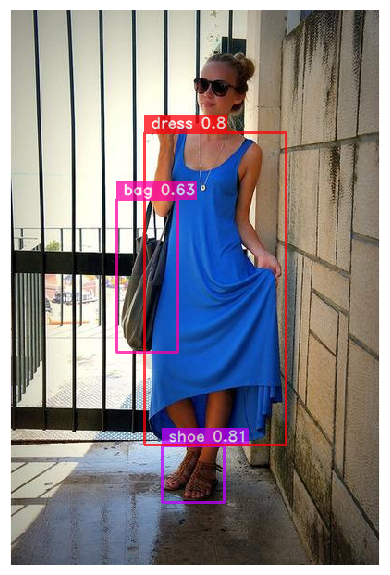

In [ ]:
img_dir = "/content/drive/MyDrive/yolo_nas/test/images/1025.jpg"
best_model.predict(img_dir).show()

# Inference and visualization with trained model:

### supervision



1.  Documnetation: https://roboflow.github.io/supervision/
2.  PIP: https://pypi.org/project/supervision/#description




In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install supervision ### library to visualize and compare results with annotations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 2.5 MB/s eta 0:00:00


In [ ]:
import supervision as sv

### creating dataloader for test images
ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"/content/drive/MyDrive/yolo_nas/test/images",
    annotations_directory_path=f"/content/drive/MyDrive/yolo_nas/test/labels",
    data_yaml_path=f"/content/drive/MyDrive/yolo_nas/data.yaml",
    force_masks=False
)

In [ ]:
CONFIDENCE_TRESHOLD = 0.5 ### setting up confidence value

predictions = {} ### prediction dictionary

for image_name, image in tqdm(ds.images.items()):
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

  0%|          | 0/77 [00:00<?, ?it/s]

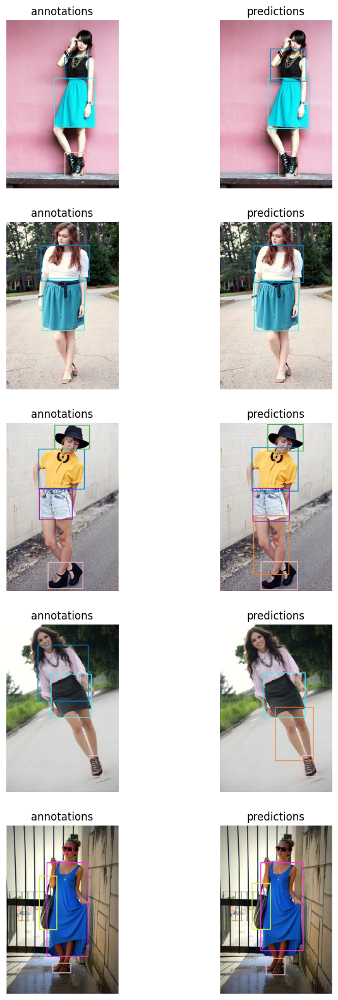

In [ ]:
import random
random.seed(10)

MAX_IMAGE_COUNT = 5 ### number of images to be shown

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n) ### randomly picking images

box_annotator = sv.BoxAnnotator() ### bbox annotator

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

### plotting images with annotations and prediction values
%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

# Special Thanks to:


*   @Roboflow: https://www.youtube.com/watch?v=V-H3eoPUnA8&ab_channel=Roboflow
*   @Nicolai Nielsen: https://www.youtube.com/watch?v=PBh9MFH2lB4&ab_channel=NicolaiNielsen

